In [1]:
import pandas as pd

onnx_df = pd.read_parquet("onnx_inference_results.parquet")
pytorch_df = pd.read_parquet("pytorch_inference_results.parquet")

In [2]:
df = pd.merge(onnx_df, pytorch_df, on="filename", suffixes=("_onnx", "_pytorch"))

df.head()

,filename,english_tags_onnx,chinese_tags_onnx,english_tags_pytorch,chinese_tags_pytorch
0,89dc5c82855d41eb.jpg,"[baby, bib, boy, chair, child, feeding chair, ...","[婴儿, 围嘴, 男孩, 椅子, 孩子, 喂养的椅子, 食物, 肮脏, 玩/演奏/运动, 房...","[baby, bib, boy, chair, child, feeding chair, ...","[婴儿, 围嘴, 男孩, 椅子, 孩子, 喂养的椅子, 食物, 肮脏, 玩/演奏/运动, 房..."
1,422d485946a706ac.jpg,"[bulletin board, classroom, table, collect, pe...","[公告栏, 教室, 桌子/表格, 收集, 人, 演讲, 投影仪, 学生, 房间, 研讨会, ...","[bulletin board, classroom, table, collect, pe...","[公告栏, 教室, 桌子/表格, 收集, 人, 演讲, 投影仪, 学生, 房间, 研讨会, ..."
2,4c48edaca65d18de.jpg,"[alcohol, bottle, bottle screw, cork, table, w...","[酒精, 瓶, 螺旋开瓶器, 瓶塞, 桌子/表格, 葡萄酒, 酒瓶, 酒杯, 手写/字迹]","[alcohol, bottle, bottle screw, cork, table, w...","[酒精, 瓶, 螺旋开瓶器, 瓶塞, 桌子/表格, 葡萄酒, 酒瓶, 酒杯, 手写/字迹]"
3,0d6a5334a8ca4185.jpg,"[bracelet, bulletin board, display, earring, j...","[手镯, 公告栏, 展示, 耳环, 珠宝, 珠宝店, 项链, 陈列柜, 标志, 商店, 手写...","[bracelet, bulletin board, display, earring, j...","[手镯, 公告栏, 展示, 耳环, 珠宝, 珠宝店, 项链, 陈列柜, 标志, 商店, 手写..."
4,9fc3574cb21bc41d.jpg,"[ballroom, building, carpet, ceiling, chandeli...","[舞厅, 建筑, 地毯, 天花板, 吊灯, 柱子, 走廊, 装修/装饰, 地板/地面, 礼堂...","[ballroom, building, carpet, ceiling, chandeli...","[舞厅, 建筑, 地毯, 天花板, 吊灯, 柱子, 走廊, 装修/装饰, 地板/地面, 礼堂..."


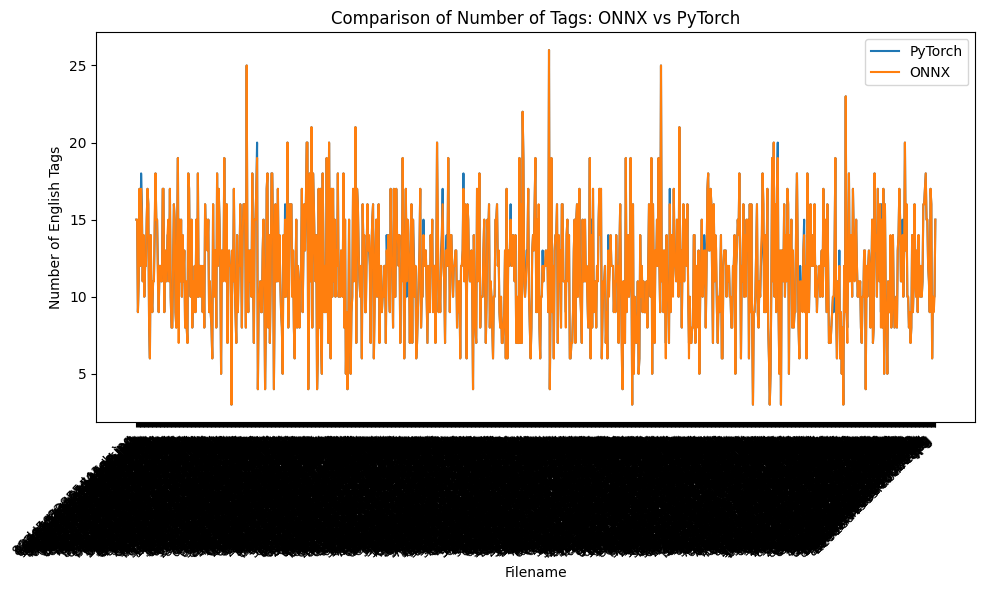

In [5]:
import matplotlib.pyplot as plt

# Calculate the number of tags for each file
df['num_tags_onnx'] = df['english_tags_onnx'].apply(len)
df['num_tags_pytorch'] = df['english_tags_pytorch'].apply(len)

plt.figure(figsize=(10, 6))
plt.plot(df['filename'], df['num_tags_pytorch'], label='PyTorch')
plt.plot(df['filename'], df['num_tags_onnx'], label='ONNX')

plt.xlabel('Filename')
plt.ylabel('Number of English Tags')
plt.title('Comparison of Number of Tags: ONNX vs PyTorch')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipykernel_57427/1616331025.py:36: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax2.boxplot([df['num_tags_onnx'], df['num_tags_pytorch']], labels=['ONNX', 'PyTorch'])


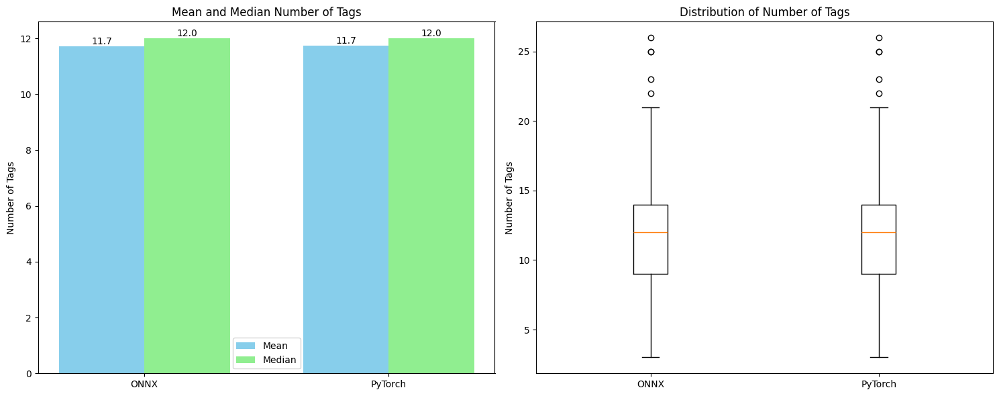

Statistics:
{'mean': num_tags_onnx       11.707
num_tags_pytorch    11.745
dtype: float64, 'median': num_tags_onnx       12.0
num_tags_pytorch    12.0
dtype: float64, 'std': num_tags_onnx       3.608347
num_tags_pytorch    3.607907
dtype: float64}

Percentage of cases where ONNX has more tags: 1.40%


In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate the number of tags for each file
df['num_tags_onnx'] = df['english_tags_onnx'].apply(len)
df['num_tags_pytorch'] = df['english_tags_pytorch'].apply(len)

# Calculate statistics
stats = {
    'mean': df[['num_tags_onnx', 'num_tags_pytorch']].mean(),
    'median': df[['num_tags_onnx', 'num_tags_pytorch']].median(),
    'std': df[['num_tags_onnx', 'num_tags_pytorch']].std()
}

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Bar plot for mean and median
x = np.arange(2)
width = 0.35
ax1.bar(x - width/2, stats['mean'], width, label='Mean', color='skyblue')
ax1.bar(x + width/2, stats['median'], width, label='Median', color='lightgreen')
ax1.set_ylabel('Number of Tags')
ax1.set_title('Mean and Median Number of Tags')
ax1.set_xticks(x)
ax1.set_xticklabels(['ONNX', 'PyTorch'])
ax1.legend()

# Add value labels on the bars
for i, v in enumerate(stats['mean']):
    ax1.text(i - width/2, v, f'{v:.1f}', ha='center', va='bottom')
for i, v in enumerate(stats['median']):
    ax1.text(i + width/2, v, f'{v:.1f}', ha='center', va='bottom')

# Box plot
ax2.boxplot([df['num_tags_onnx'], df['num_tags_pytorch']], labels=['ONNX', 'PyTorch'])
ax2.set_ylabel('Number of Tags')
ax2.set_title('Distribution of Number of Tags')

plt.tight_layout()
plt.show()

# Print additional statistics
print("Statistics:")
print(stats)

# Calculate and print the percentage of cases where ONNX has more tags
onnx_more = (df['num_tags_onnx'] > df['num_tags_pytorch']).mean() * 100
print(f"\nPercentage of cases where ONNX has more tags: {onnx_more:.2f}%")

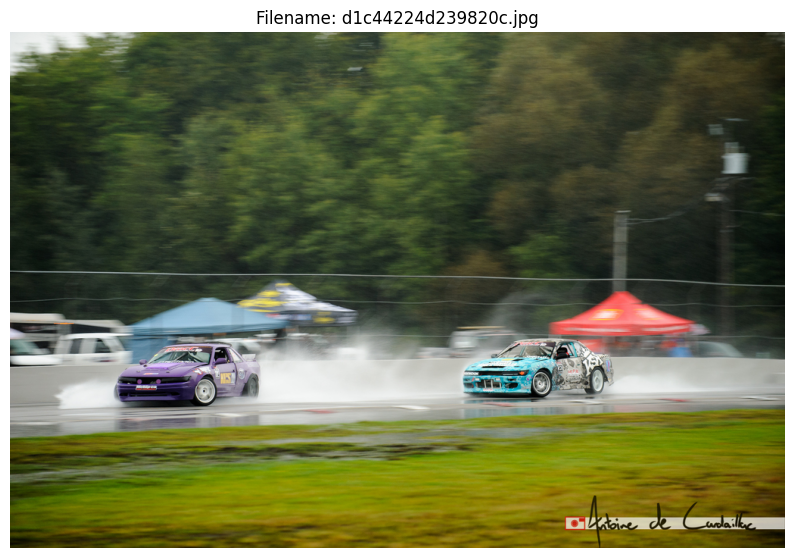

Filename: sample_images/d1c44224d239820c.jpg

Common Tags:
car, curve, dirt track, drift, drive, purple, race, race car, race track, tire, track, turn

Tags only in ONNX:


Tags only in PyTorch:
couple

Number of ONNX tags: 12
Number of PyTorch tags: 13


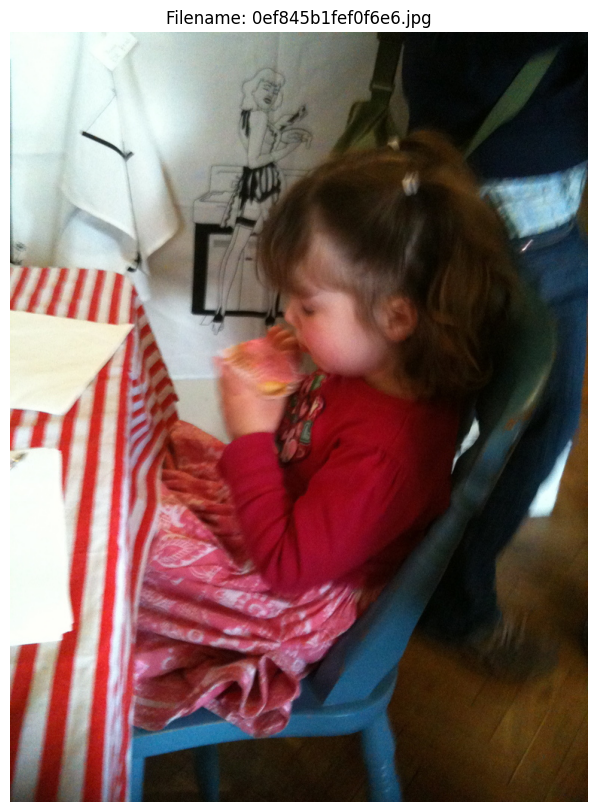

Filename: sample_images/0ef845b1fef0f6e6.jpg

Common Tags:
bite, blue, chair, child, dinning table, eat, feeding chair, food, girl, pastry, red, sit, stool, table, tablecloth

Tags only in ONNX:


Tags only in PyTorch:
kitchen table

Number of ONNX tags: 15
Number of PyTorch tags: 16


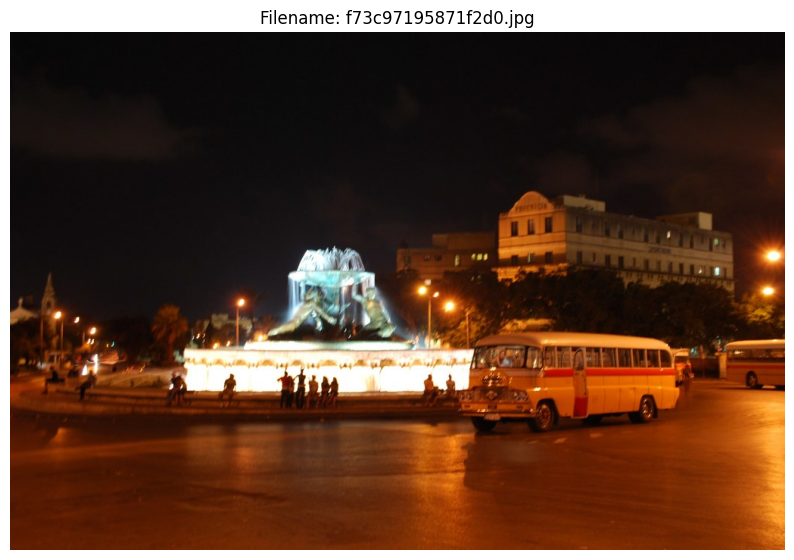

Filename: sample_images/f73c97195871f2d0.jpg

Common Tags:
building, bus, city bus, drive, illuminate, light, night, night view, park, person, plaza, road, tour bus

Tags only in ONNX:


Tags only in PyTorch:
sculpture

Number of ONNX tags: 13
Number of PyTorch tags: 14


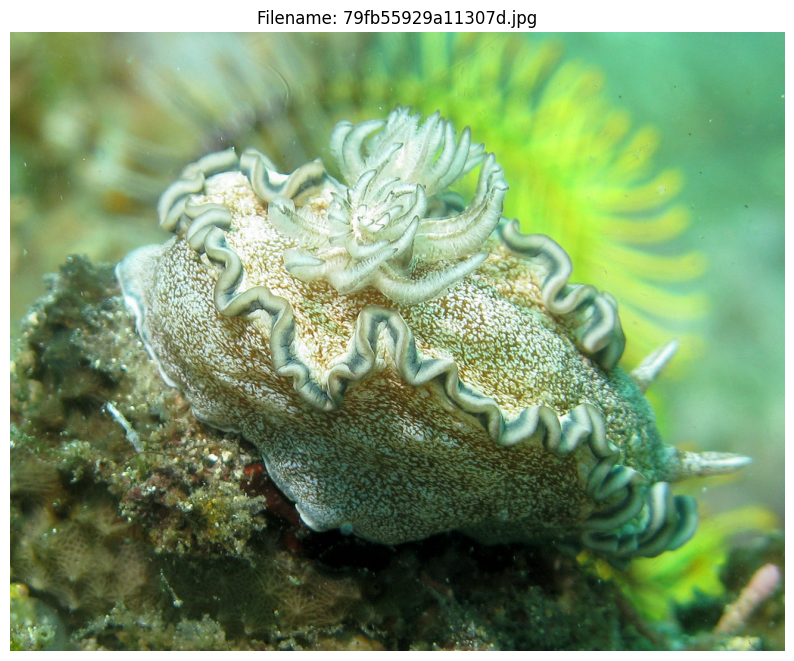

Filename: sample_images/79fb55929a11307d.jpg

Common Tags:
anemone, clam, close-up, coral, coral reef, octopus, reef, sea, seashell, shell, sponge, stone, underwater, worm

Tags only in ONNX:
hide

Tags only in PyTorch:


Number of ONNX tags: 15
Number of PyTorch tags: 14


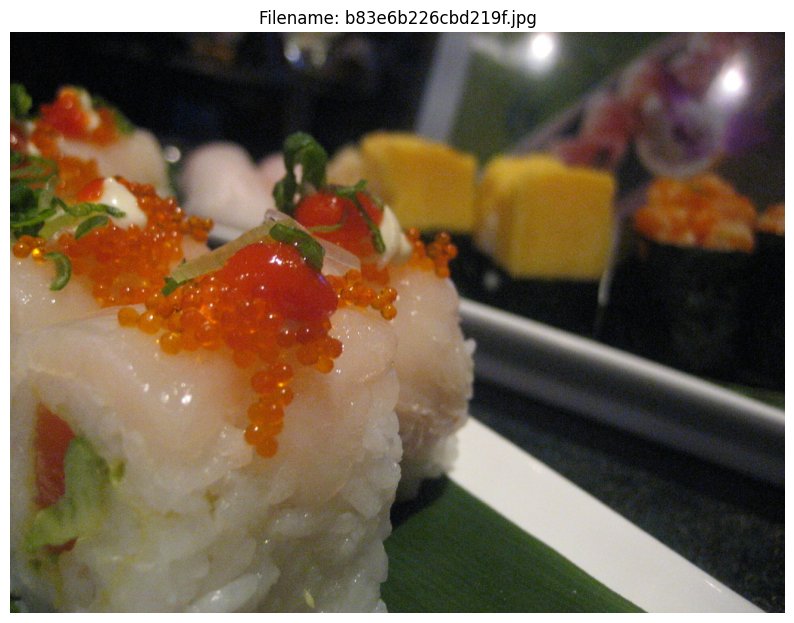

Filename: sample_images/b83e6b226cbd219f.jpg

Common Tags:
caviar, chopstick, food, green, plate, platter, roll, salmon, seafood, sprinkle, sushi, white

Tags only in ONNX:


Tags only in PyTorch:
peak

Number of ONNX tags: 12
Number of PyTorch tags: 13


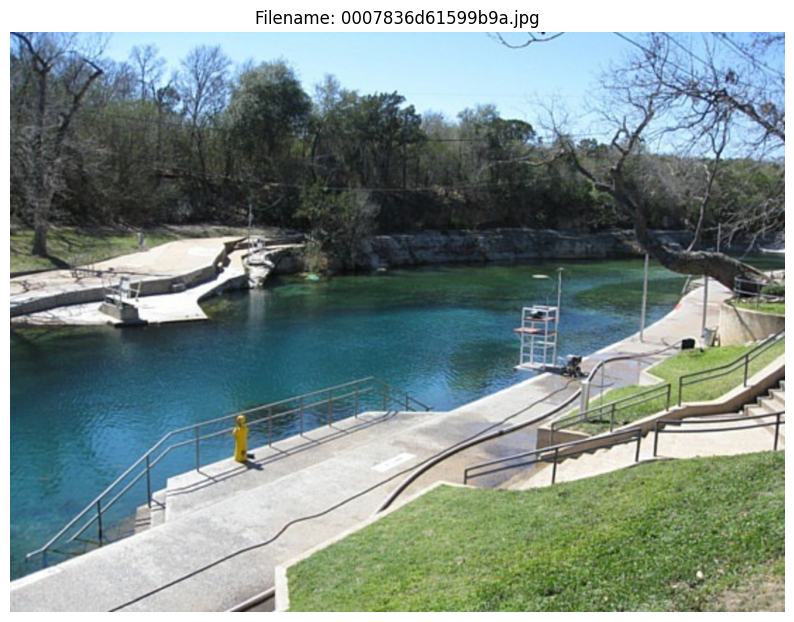

Filename: sample_images/0007836d61599b9a.jpg

Common Tags:
blue, dam, lake, lead to, lock, park, pond, rail, ramp, river, stair, water, waterway

Tags only in ONNX:
balustrade

Tags only in PyTorch:


Number of ONNX tags: 14
Number of PyTorch tags: 13


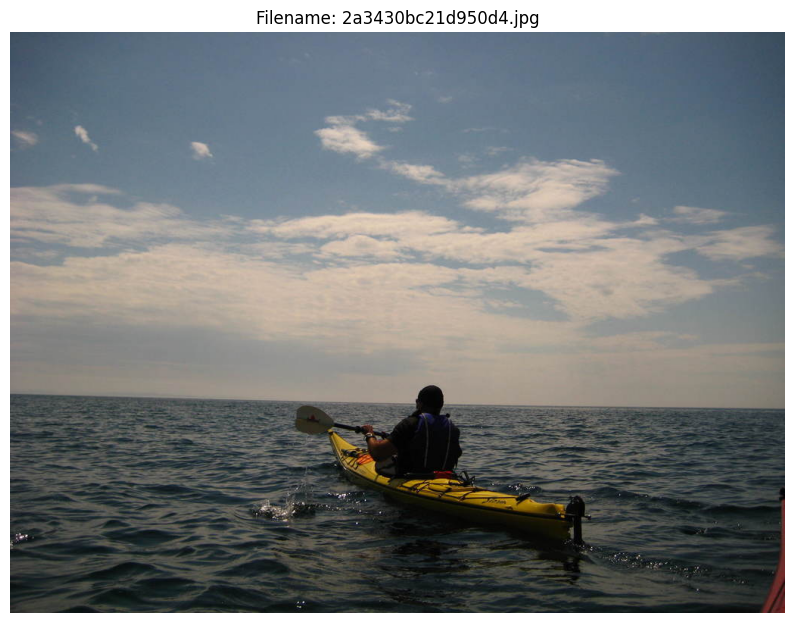

Filename: sample_images/2a3430bc21d950d4.jpg

Common Tags:
boat, calm, canoe, kayak, man, paddle, person, sea, water, yellow

Tags only in ONNX:


Tags only in PyTorch:
sky

Number of ONNX tags: 10
Number of PyTorch tags: 11


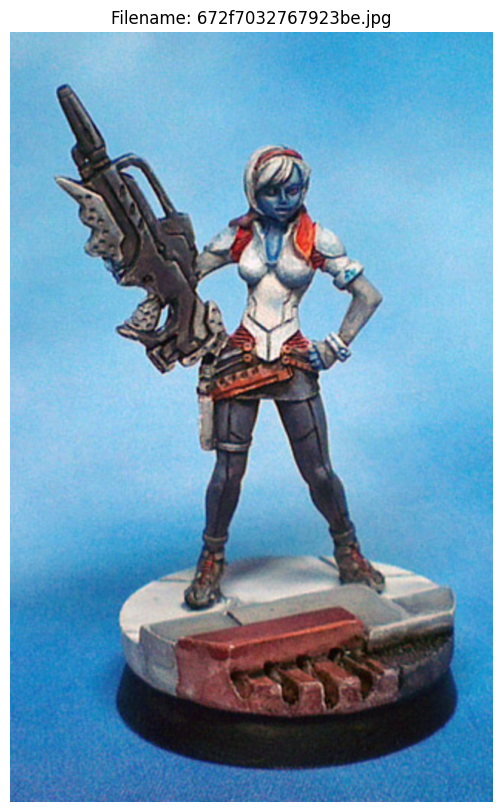

Filename: sample_images/672f7032767923be.jpg

Common Tags:
armor, catch, draw, figurine, footstall, gun, miniature, number, person, rifle, statue, sword, toy, weapon

Tags only in ONNX:


Tags only in PyTorch:
sculpture

Number of ONNX tags: 14
Number of PyTorch tags: 15


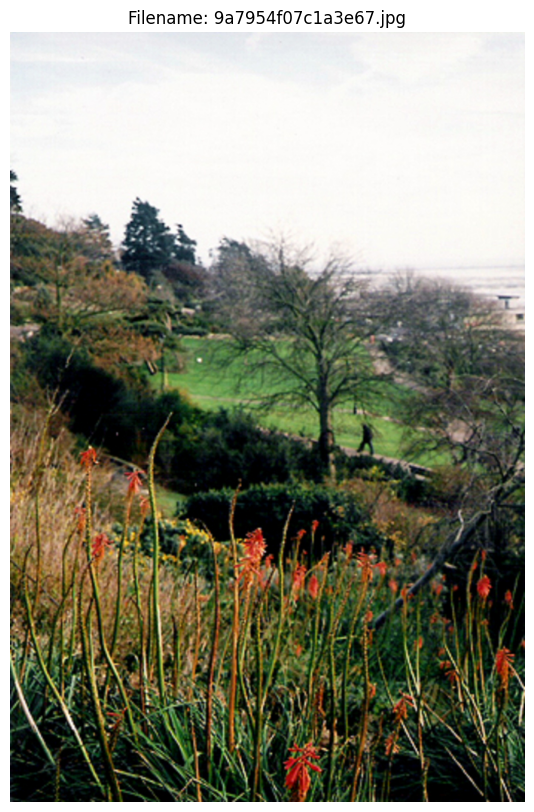

Filename: sample_images/9a7954f07c1a3e67.jpg

Common Tags:
flower, grass, green, hill, hillside, lush, plant, red, sea, tree, vegetation, wildflower

Tags only in ONNX:
brush

Tags only in PyTorch:


Number of ONNX tags: 13
Number of PyTorch tags: 12


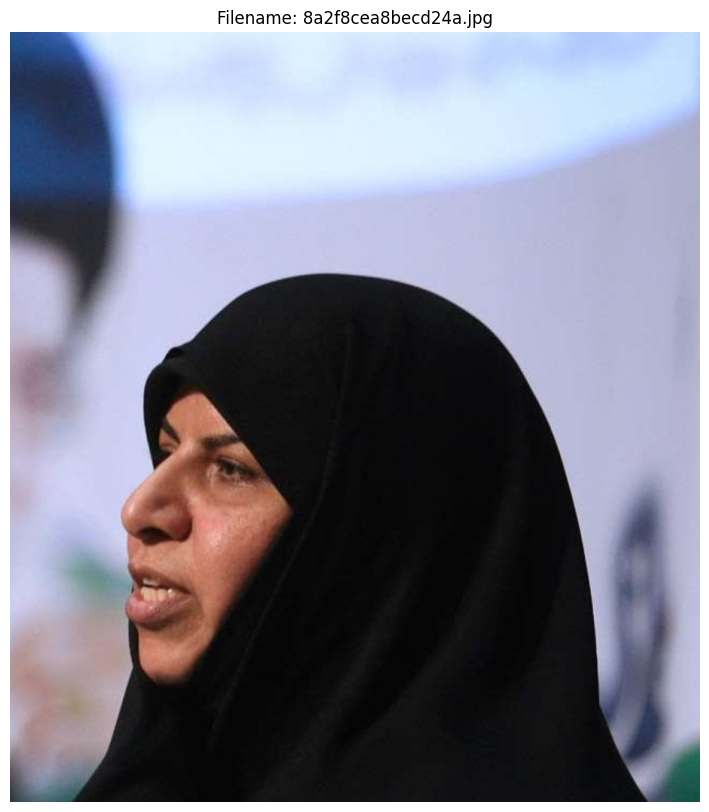

Filename: sample_images/8a2f8cea8becd24a.jpg

Common Tags:
black, garment, headscarf, scarf, shawl, speech, talk, veil, wear, woman

Tags only in ONNX:


Tags only in PyTorch:
smile

Number of ONNX tags: 10
Number of PyTorch tags: 11


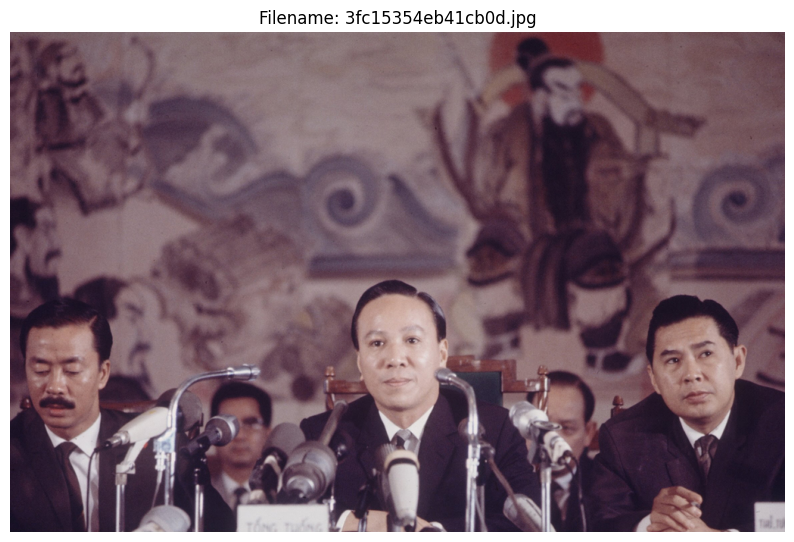

Filename: sample_images/3fc15354eb41cb0d.jpg

Common Tags:
business suit, man, microphone, podium, sit, speaker, speech, stand, suit, tie

Tags only in ONNX:


Tags only in PyTorch:
news conference

Number of ONNX tags: 10
Number of PyTorch tags: 11


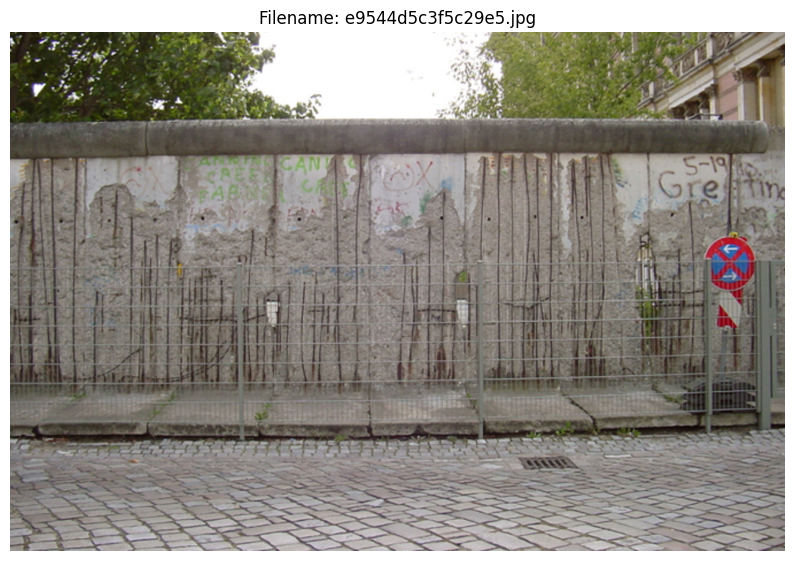

Filename: sample_images/e9544d5c3f5c29e5.jpg

Common Tags:
barrier, blanket, doodle, fence, pavement, sign, street sign, traffic sign, wall, writing

Tags only in ONNX:


Tags only in PyTorch:
building

Number of ONNX tags: 10
Number of PyTorch tags: 11


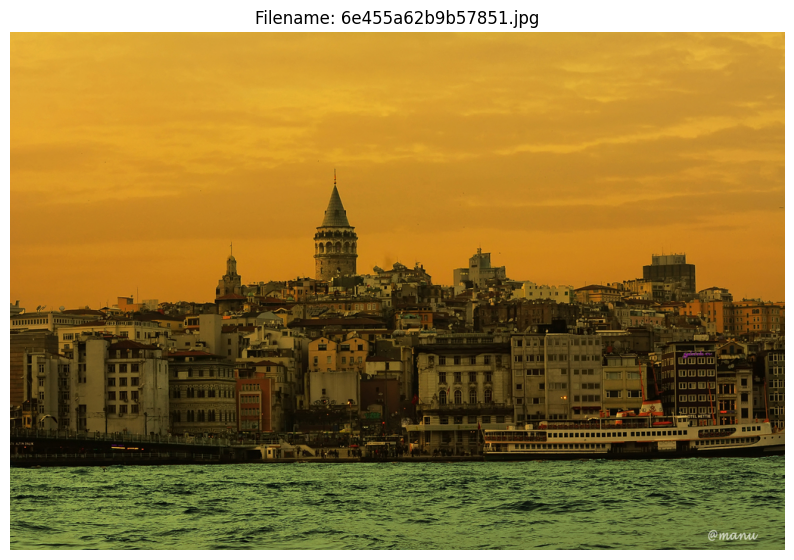

Filename: sample_images/6e455a62b9b57851.jpg

Common Tags:
boat, building, city, city skyline, city view, ferry, sea, sky, sunset, urban, water

Tags only in ONNX:


Tags only in PyTorch:
tower

Number of ONNX tags: 11
Number of PyTorch tags: 12


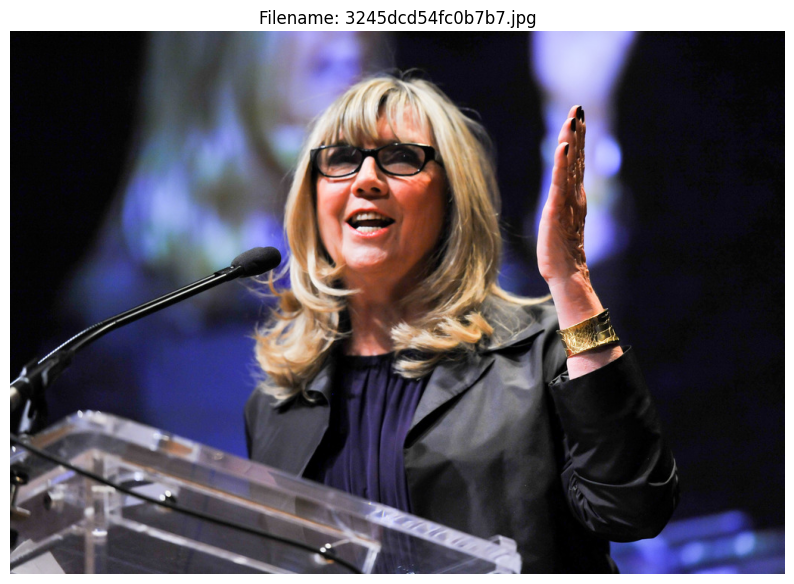

Filename: sample_images/3245dcd54fc0b7b7.jpg

Common Tags:
cup, deliver, give, hand, microphone, podium, speaker, speech, stand, wear, woman

Tags only in ONNX:


Tags only in PyTorch:
jacket

Number of ONNX tags: 11
Number of PyTorch tags: 12


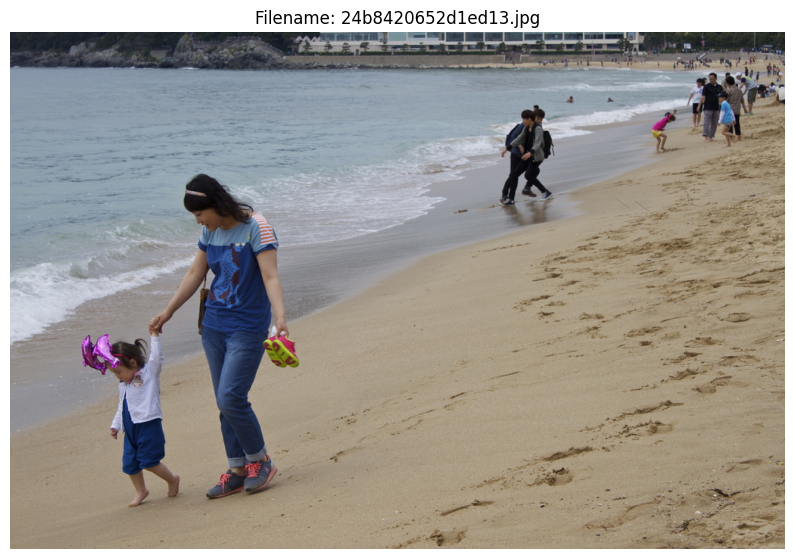

Filename: sample_images/24b8420652d1ed13.jpg

Common Tags:
beach, catch, child, coast, girl, hand, person, sand, sandal, sea, shoreline, toy, walk, woman

Tags only in ONNX:


Tags only in PyTorch:
daughter

Number of ONNX tags: 14
Number of PyTorch tags: 15


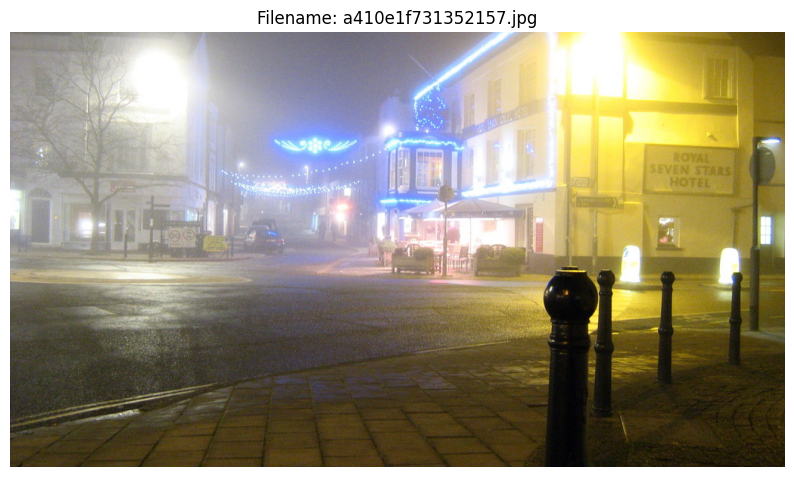

Filename: sample_images/a410e1f731352157.jpg

Common Tags:
building, christmas light, city street, illuminate, light, night, night view, parking meter, pole, road, street corner, street scene, wet

Tags only in ONNX:


Tags only in PyTorch:
pavement

Number of ONNX tags: 13
Number of PyTorch tags: 14


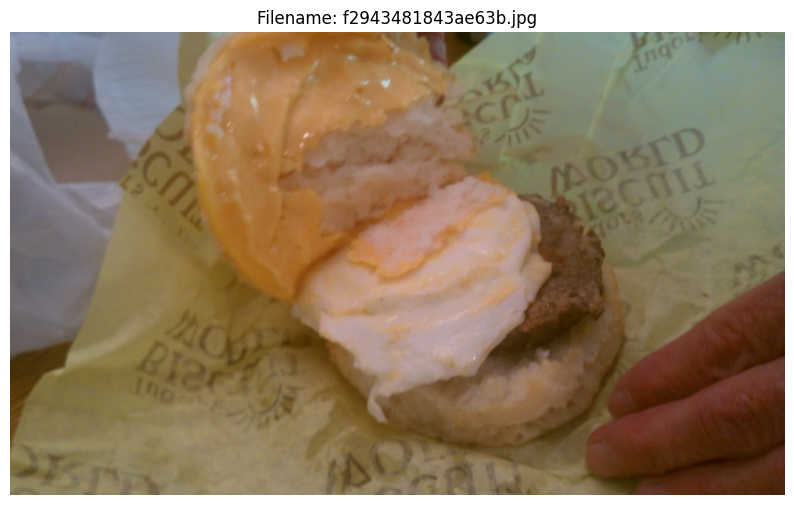

Filename: sample_images/f2943481843ae63b.jpg

Common Tags:
bite, caramel, catch, cheeseburger, cream, food, frosting, glaze, hamburger, hand, muffin, napkin, paper towel, pastry, peanut butter, person, potato, roll, sandwich

Tags only in ONNX:


Tags only in PyTorch:
condiment

Number of ONNX tags: 19
Number of PyTorch tags: 20


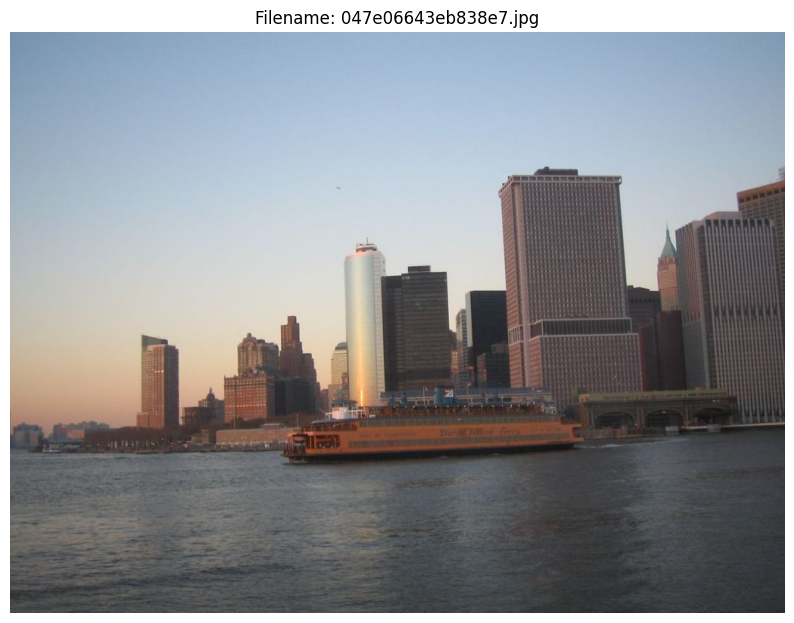

Filename: sample_images/047e06643eb838e7.jpg

Common Tags:
boat, building, city, city skyline, city view, cruise, ferry, river, skyscraper, travel, vessel, water, waterway, yellow

Tags only in ONNX:
float

Tags only in PyTorch:


Number of ONNX tags: 15
Number of PyTorch tags: 14


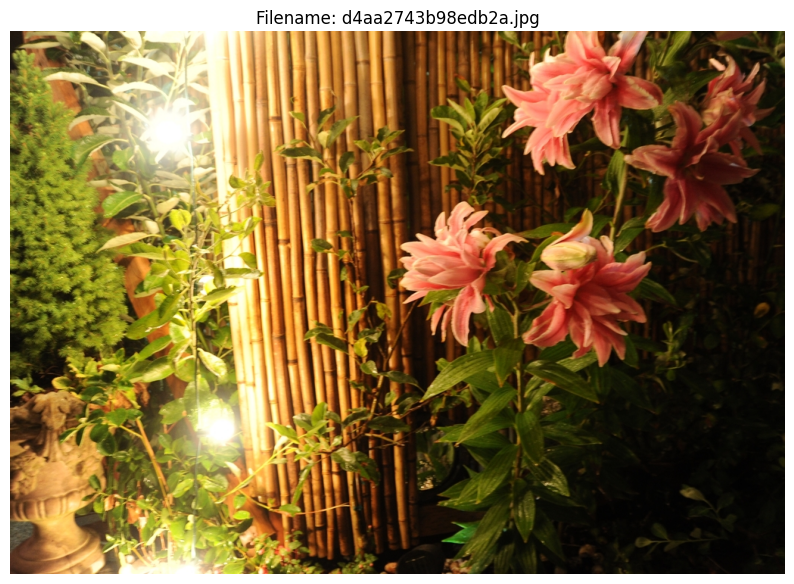

Filename: sample_images/d4aa2743b98edb2a.jpg

Common Tags:
flower, garden, greenery, illuminate, lamp, light, night, night view, pink, plant, urn

Tags only in ONNX:


Tags only in PyTorch:
pot

Number of ONNX tags: 11
Number of PyTorch tags: 12


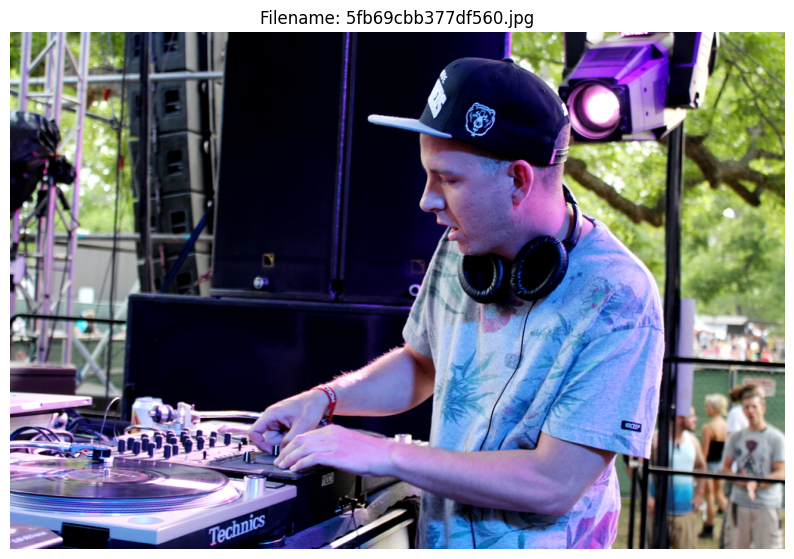

Filename: sample_images/5fb69cbb377df560.jpg

Common Tags:
baseball hat, dj, earphone, electronic, equipment, festival, man, mixer, music, play, record, record player, shirt, spin, wear

Tags only in ONNX:


Tags only in PyTorch:
stand

Number of ONNX tags: 15
Number of PyTorch tags: 16


In [21]:

diff_df = df[df['tag_difference'] != 0]


def display_image_and_tags(filename):
    row = df[df['filename'] == filename].iloc[0]
    
    plt.figure(figsize=(10, 10))
    img = plt.imread("sample_images/"+filename)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Filename: {filename}")
    plt.show()
    
    print(f"Filename: sample_images/{filename}")
    
    onnx_tags = set(row['english_tags_onnx'])
    pytorch_tags = set(row['english_tags_pytorch'])
    
    common_tags = onnx_tags.intersection(pytorch_tags)
    only_onnx = onnx_tags - pytorch_tags
    only_pytorch = pytorch_tags - onnx_tags
    
    print("\nCommon Tags:")
    print(", ".join(sorted(common_tags)))
    
    print("\nTags only in ONNX:")
    print(", ".join(sorted(only_onnx)))
    
    print("\nTags only in PyTorch:")
    print(", ".join(sorted(only_pytorch)))
    
    print(f"\nNumber of ONNX tags: {len(onnx_tags)}")
    print(f"Number of PyTorch tags: {len(pytorch_tags)}")

for filename in diff_df['filename'].sample(20):
    display_image_and_tags(filename)

